# VK friends graph analysis

author: Elvira Dzhuraeva

In [4]:
import json

import requests
from networkx.readwrite import json_graph
import networkx as nx
from collections import Counter
import numpy as np
from networkx.algorithms import community
import matplotlib.pyplot as plt
import networkx
import time
import collections
%matplotlib inline

In [48]:
graph = {}

In [218]:
access_token = 'your token'

In [154]:
def get_friends_ids(user_id):
    friends_url = 'https://api.vk.com/method/friends.get?v=5.52&access_token={}&scope=offline&user_id={}' 
    json_response = requests.get(friends_url.format(access_token, user_id)).json()
    if json_response.get('error'):
        print(json_response.get('error'))
        return list()
    return json_response[u'response']

In [290]:
def get_users_info(user_ids):
    friends_url = 'https://api.vk.com/method/users.get?v=5.52&access_token={}&user_ids={}' 
    json_response = requests.get(friends_url.format(access_token, user_ids)).json()
#     print(json_response)
    if json_response.get('error'):
        print(json_response.get('error'))
        return list()
    return json_response[u'response']

In [134]:
for friend_id in friend_ids['items']:
    print('Processing id: ', friend_id)
    try:
        graph[friend_id] = get_friends_ids(friend_id)['items']
        count = graph[friend_id]['count']
        print(count)
    except:
        pass

### Соберем базовую информацию о людях

In [135]:
users_dict = {}

In [208]:
for user_id in friend_ids['items']:
    users_dict[user_id] = get_users_info(user_id)

In [147]:
g = networkx.Graph(directed=False)
for i in graph:
    g.add_node(i)
    for j in graph[i]:
        if i != j and i in friend_ids['items'] and j in friend_ids['items']:
            g.add_edge(i, j)

In [70]:
print(g.number_of_edges(), g.number_of_nodes())

1854 269


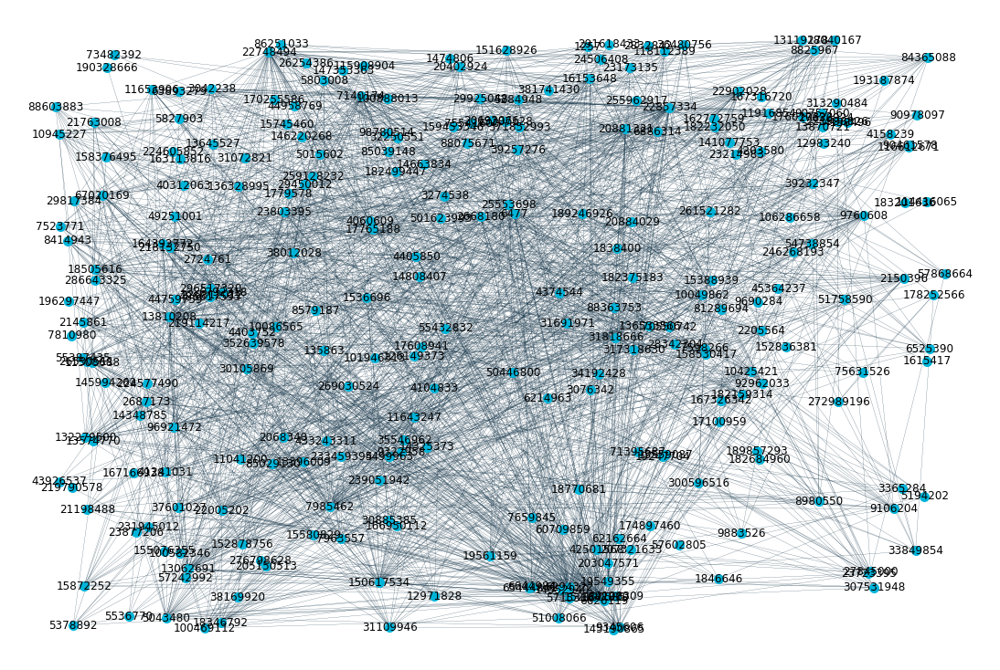

In [120]:
nx.draw_random(g, node_color='#00b4d9',edge_color='#0E2F44', node_size=100, with_labels=True, width=0.2)

In [ ]:
users_betweenness_dict[k] = get_users_info(betweenness_centrality_counts.most_common(10))

In [248]:
def get_user_label(user_id, user_dict):
    if user_id in user_dict: 
        user = user_dict[user_id]
        user_label = '{}'.format(user['last_name'])
        return user_label
    else:
        return user_id

### Betweeness centrality

In [345]:
users_betweenness_dict = {}
betweenness_centrality = nx.betweenness_centrality(g)
betweenness_centrality_counts = Counter(betweenness_centrality)
for k, v in betweenness_centrality_counts.most_common(20):
    users_betweenness_dict[k] = get_users_info(k)[0]
    print(get_user_label(k, users_betweenness_dict), v)

Волошин 0.11232144818902941
Фатхи 0.11178354565819361
Мельникова 0.08337584836236171
Виноградова 0.0724361678856634
Zinoveva 0.07037844485437979
Ibragimov 0.05527408093378824
Джураев 0.05226675610710493
Абашин 0.05164738661552806
Огай 0.04518465723815381
Цветков 0.038903485834597344
Atlasova 0.038848783073579064
Чернова 0.0380174814236036
Майгуров 0.03545691718590626
Парначёв 0.03435532215811355
Коршунов 0.03298825356712911
Чернявский 0.03162122699600356
Фазылова 0.031111186030816015
Ожегов 0.027572888580468528
Волчёнкова 0.023377085939730813
Павлов 0.021892389499055014


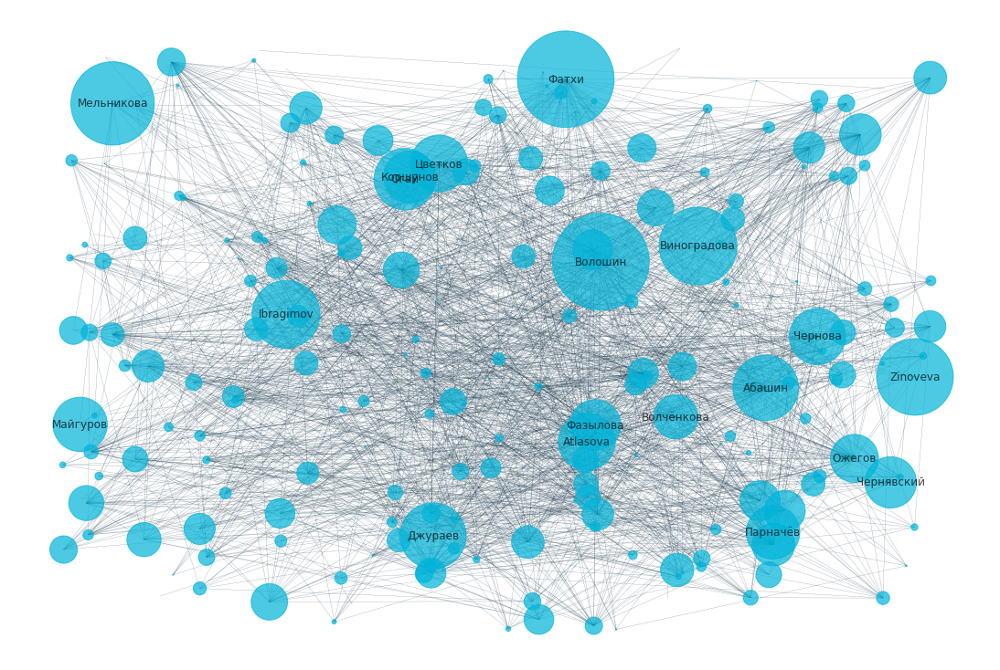

In [341]:
th = betweenness_centrality_counts.most_common(20)[-1][1]
nx.draw_random(
    g, 
    node_color='#00b4d9', 
    with_labels=True, 
    alpha=0.7, 
    labels={n[0]: get_user_label(n[0], users_betweenness_dict) for n in g.nodes.data() if betweenness_centrality[n[0]] > th}, 
    node_size=np.array(list(betweenness_centrality.values())) * 100000,
    edge_color='#0E2F44',
    width=0.2
)

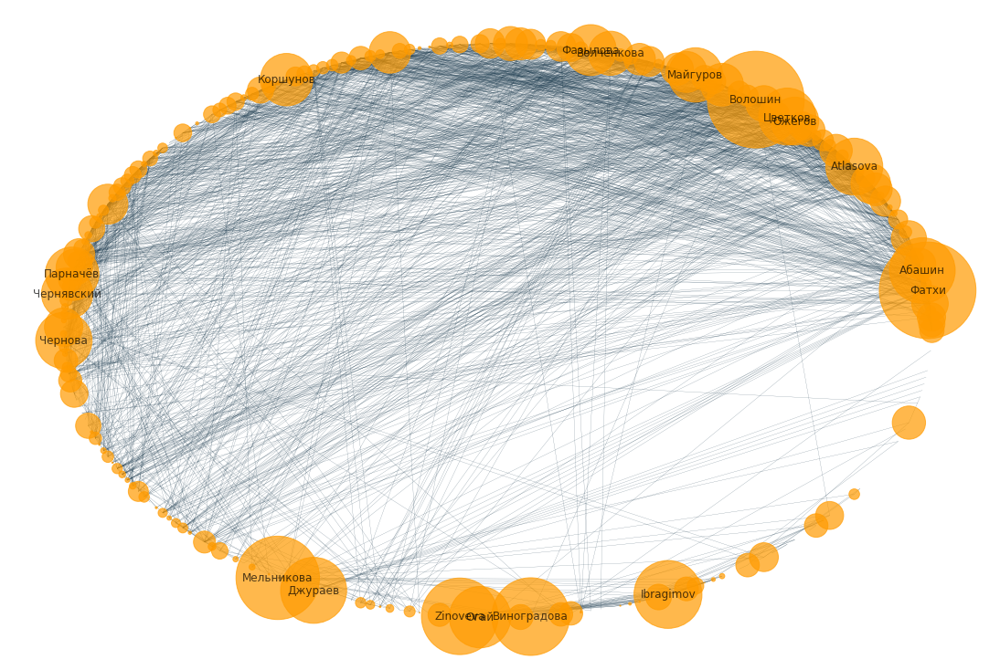

In [335]:
th = betweenness_centrality_counts.most_common(20)[-1][1]
nx.draw_shell(
    g, 
    node_color='#FF9B00', 
    with_labels=True, 
    alpha=0.7, 
    labels={n[0]: get_user_label(n[0], users_betweenness_dict) for n in g.nodes.data() if betweenness_centrality[n[0]] > th}, 
    node_size=np.array(list(betweenness_centrality.values())) * 100000,
    edge_color='#0E2F44',
    width=0.2
)

### Degree centrality

In [268]:
users_degree_dict = {}
degree_centrality = nx.degree_centrality(g)
degree_centrality_counts = Counter(degree_centrality)
for k, v in degree_centrality_counts.most_common(20):
    users_degree_dict[k] = get_users_info(k)
    print(get_user_label(k, users_degree_dict), v)

Абашин 0.26492537313432835
Atlasova 0.24253731343283583
Ожегов 0.24253731343283583
Павлов 0.24253731343283583
Цветков 0.23134328358208955
Волошин 0.22388059701492538
Фатхи 0.22014925373134328
Opryshko 0.2126865671641791
Чернобровкин 0.1828358208955224
Даньшина 0.17164179104477612
Захарчук 0.17164179104477612
Леонтьев 0.16044776119402984
Зубарева 0.16044776119402984
Фазылова 0.15671641791044777
Кочетков 0.15298507462686567
Дорофеев 0.15298507462686567
Латкин 0.15298507462686567
Гаврилина 0.1417910447761194
Светлов 0.13805970149253732
Strogonova 0.13059701492537312


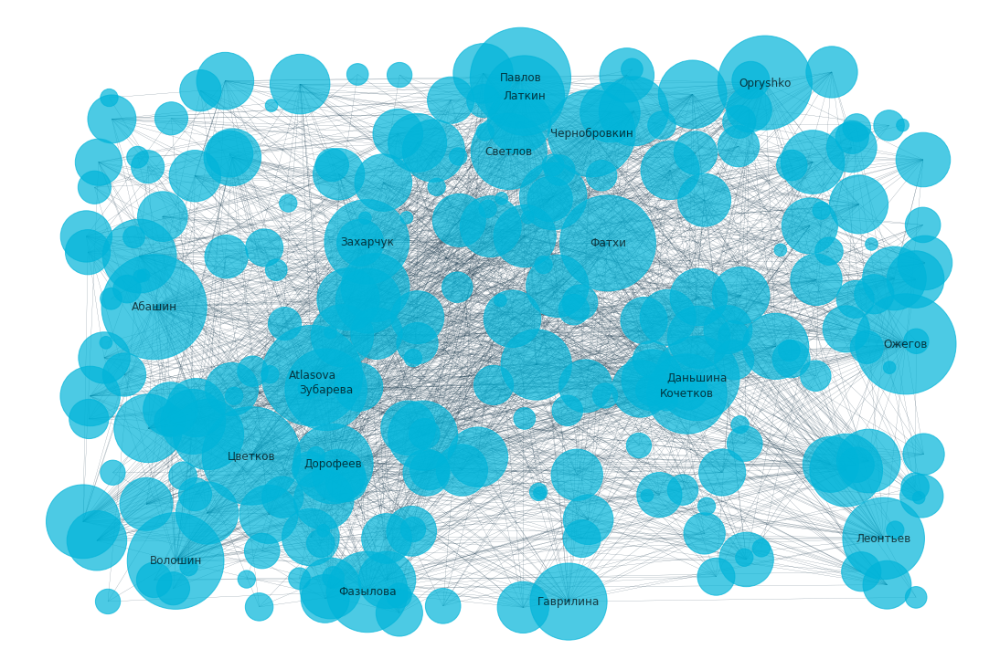

In [258]:
th = degree_centrality_counts.most_common(20)[-1][1]
nx.draw_random(
    g,
    labels={n[0]: get_user_label(n[0], users_degree_dict) for n in g.nodes.data() if degree_centrality[n[0]] > th},
    node_size=np.array(list(degree_centrality.values())) * 50000,
    node_color='#00b4d9', 
    with_labels=True, 
    alpha=0.7, 
    edge_color='#0E2F44',
    width=0.2,
)

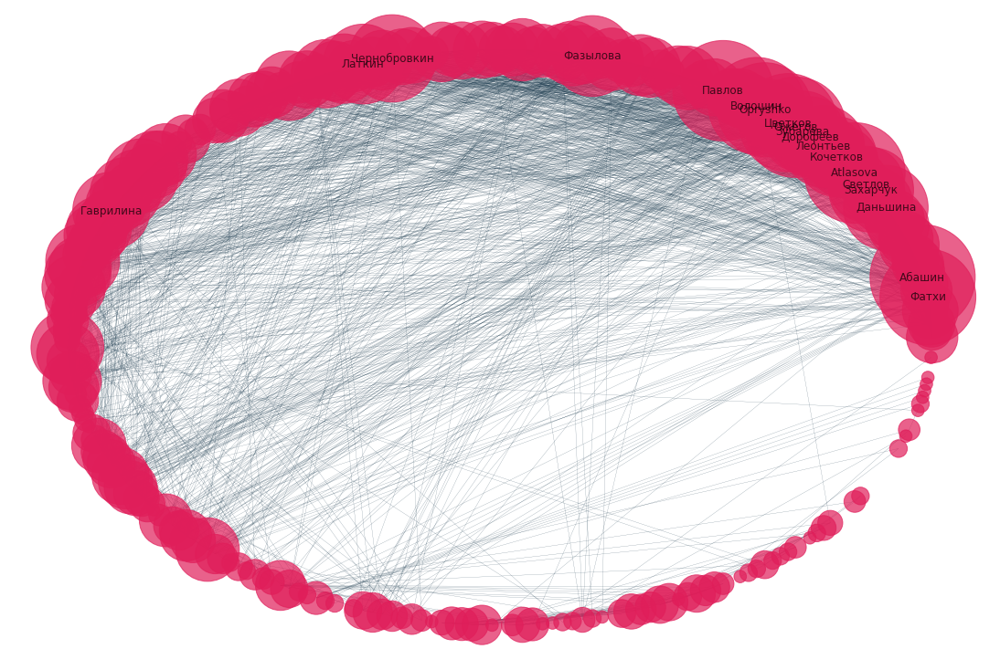

In [334]:
th = degree_centrality_counts.most_common(20)[-1][1]
nx.draw_shell(
    g,
    labels={n[0]: get_user_label(n[0], users_degree_dict) for n in g.nodes.data() if degree_centrality[n[0]] > th},
    node_size=np.array(list(degree_centrality.values())) * 50000,
    node_color='#E01E5A', 
    with_labels=True, 
    alpha=0.7, 
    edge_color='#0E2F44',
    width=0.2,
)

### Closeness centrality

In [344]:
users_closeness_dict = {}
closeness_centrality = nx.closeness_centrality(g)
closeness_centrality_counts = Counter(closeness_centrality)
for k, v in closeness_centrality_counts.most_common(30):
    users_closeness_dict[k] = get_users_info(k)[0]
    print(get_user_label(k, users_closeness_dict), v)

Абашин 0.41146343571716704
Волошин 0.4013899429406639
Atlasova 0.3983888966383038
Ожегов 0.39764563377144124
Цветков 0.3947001105583195
Фатхи 0.3939705354925925
Opryshko 0.3932436525857796
Павлов 0.38682043502993196
Чернобровкин 0.38611967337226905
Захарчук 0.38472573953338
Даньшина 0.3840325400026892
Дорофеев 0.3840325400026892
Чернова 0.3826536080816742
Кочетков 0.3806036780383795
Зубарева 0.3745835847126407
Коршунов 0.37392642052893427
Светлов 0.3726189854921198
Латкин 0.371968690578521
Крыгин 0.3693900514757236
Никоноров 0.3693900514757236
Леонтьев 0.3687509683416826
Новосёлов 0.3687509683416826
Фазылова 0.36747941327843536
Рассказов 0.3618642779312267
Махмутов 0.3594233721778963
Руднев 0.35761419413002105
Сурков 0.35701517537938443
Чернявский 0.3564181600359407
Александрович 0.3558231380659308
Амбарцумов 0.3552300995024875


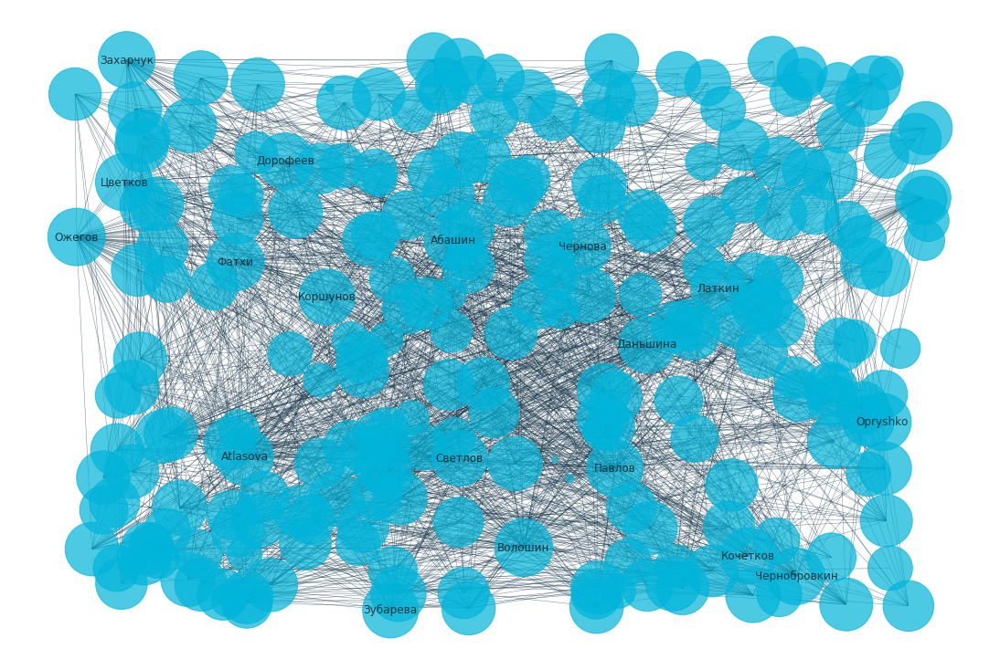

In [266]:
th = closeness_centrality_counts.most_common(20)[-1][1]
nx.draw_random(
    g,
    labels={n[0]: get_user_label(n[0], users_closeness_dict) for n in g.nodes.data() if closeness_centrality[n[0]] > th},
    node_size=np.array(list(closeness_centrality.values())) * 10000,
    node_color='#00b4d9', 
    with_labels=True, 
    alpha=0.7, 
    edge_color='#0E2F44',
    width=0.4,
)

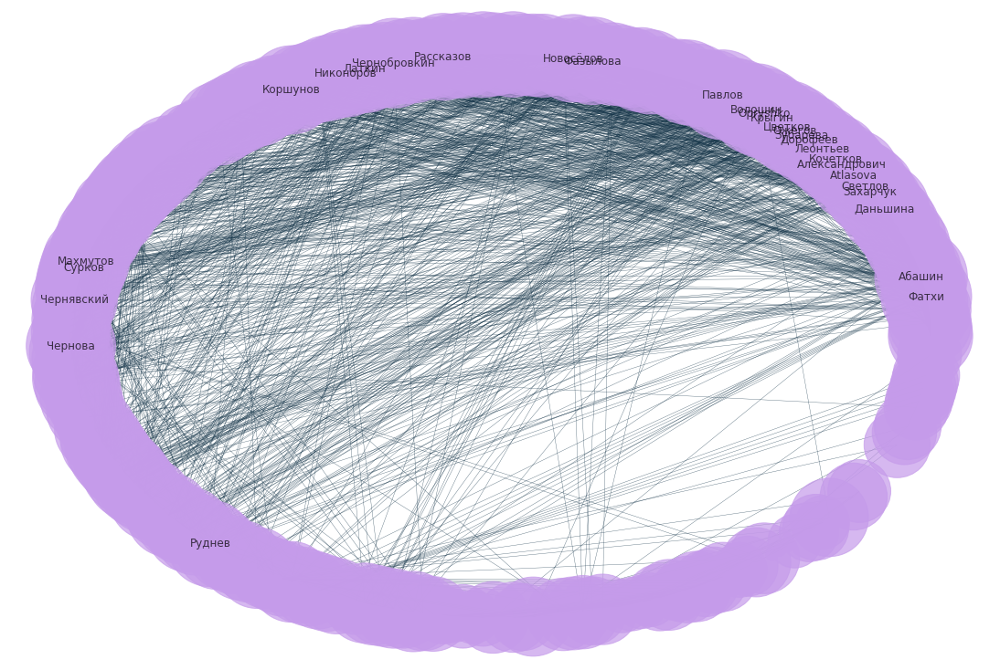

In [340]:
th = closeness_centrality_counts.most_common(30)[-1][1]
nx.draw_shell(
    g,
    labels={n[0]: get_user_label(n[0], users_closeness_dict) for n in g.nodes.data() if closeness_centrality[n[0]] > th},
    node_size=np.array(list(closeness_centrality.values())) * 25000,
    node_color='#C59BEA', 
    with_labels=True, 
    alpha=0.7, 
    edge_color='#0E2F44',
    width=0.4,
)

In [166]:
from networkx.algorithms import community

communities_generator = community.girvan_newman(g)
top_level_communities = next(communities_generator)
next_level_communities = next(communities_generator)
communities = sorted(map(sorted, next_level_communities))


In [269]:
groups = {}

In [294]:
for c in communities:
    i = i + 1
    if (len(c) <= 1):
        groups[i] = get_users_info(c[0])
    else:
        groups[i] = get_users_info(c)

In [319]:
def print_names(user_ids):
    for user in user_ids:
        print(user['last_name'])

In [320]:
users_dict_communities = {}
for k in groups:
    print('Group ', k, ':')
    group = groups[k]
    if(len(group)):
        print(print_names(group), '\n')
    else:
        pass
    

Group  1 :
Озерная
Горный
Боровик
Путинцева
Шалина
Даньшина
Isakov
Урусов
Лемберский
Назаров
Кильдиев
Коршунов
Андреева
Федосеева
Лукьянова
Velichkevich
Сурков
Махортова

Гафиятуллин
Шамшединов
Сёмин
Касаткин
Термен
Омел
Iskhakov
Эрдынеев
Рассказов
Заикин
Говоровский
Strogonova
Сомов
Васильев
Зуев
Чернега
Захарчук
Yagupov
Кораблин
Светлов
Каплан
Халайджи
Замуруев

Нейман
Atlasova
Титаевский
Rocknrolla
Парначёв
Сусеков
Александрович
Фатхи
Кильдишев
Владиславский
Данилов
Feygina
Головлев
Гвоздев
Анпилогов
Кочетков
Комар
Амбарцумов
Спиров
Яночкина
Kitashov
Свитанько
Байков
Леонтьев
Руднев
Хасанов
Биенко
Батрак
Чернобровкин
Козлов
Молостова

Степанов
Воропаев
Абашин
Колчанов
Назаров
Халипина
Каюмов
Лобанов
Ватулин
Марат
Ожиганов
Картава
Куликова
Курицин
Головащенко
Сычева
Дорофеев
Ibraimova
Лукинский
Джанаев
Soltanov
Радочин
Potkin
Гаврилина
Демиденко
Боюр
Соколова
Зубарева
Ожегов
Цветков
Чернова
Чернявский
Трофимова
Латкин
Румянцев
Копылова
Волчёнкова
Косенкова
Канев
Котляр-Шапиров

Махму